# Giới thiệu bài toán

Dựa vào bộ dữ liệu 10 năm quan sát thời tiết hàng ngày từ nhiều địa điểm trên khắp nước Úc. Để dự đoán ngày hôm sau ở Úc có mưa hay không.

RainTomorrow là biến mục tiêu để dự đoán. Nó có nghĩa là - trời có mưa vào ngày hôm sau, Yes hay No ? Cột này là Yes nếu lượng mưa của ngày hôm đó từ 1mm trở lên.

Thông tin các cột trong bộ dữ liệu :

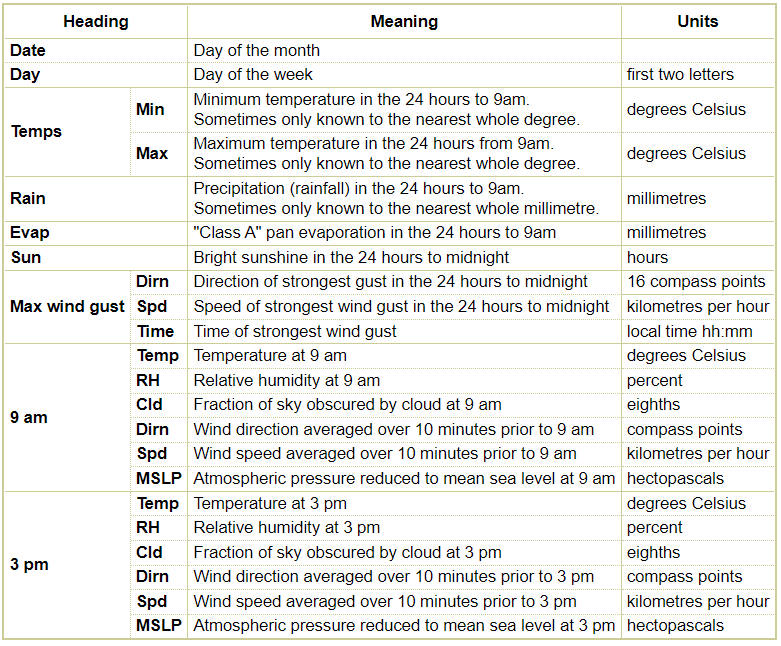

# Trực quan hóa dữ liệu

Import các thư viện cần thiết

In [ ]:
from google.colab import drive
import os

drive.mount('/content/gdrive')
os.chdir('gdrive/MyDrive/ML')

Mounted at /content/gdrive


In [ ]:
! pip install https://github.com/pandas-profiling/pandas-profiling/archive/master.zip 

In [ ]:
!pip install catboost

In [ ]:
!pip install --upgrade category_encoders

In [ ]:
import pandas as pd
import pandas_profiling
from pandas_profiling import ProfileReport
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from plotly.subplots import make_subplots
from plotly.offline import iplot
from sklearn import preprocessing 
from sklearn.preprocessing import LabelEncoder
from imblearn.over_sampling import SMOTE
%matplotlib inline
from sklearn.ensemble import RandomForestClassifier
from sklearn.linear_model import LogisticRegression
from sklearn import datasets, linear_model, metrics
from sklearn.ensemble import VotingClassifier
from sklearn.model_selection import RepeatedStratifiedKFold
from sklearn.model_selection import cross_val_score
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
import warnings
warnings.filterwarnings('ignore')
import sklearn
from sklearn.metrics import plot_confusion_matrix
from sklearn.linear_model import SGDClassifier
from sklearn.ensemble import AdaBoostClassifier
from xgboost import XGBClassifier 
from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.svm import SVC
from sklearn.naive_bayes import GaussianNB
from sklearn.metrics import f1_score
from sklearn.ensemble import GradientBoostingClassifier
from collections import Counter
from sklearn.metrics import precision_recall_fscore_support
from sklearn.model_selection import GridSearchCV
from imblearn.combine import SMOTETomek 
from xgboost import XGBClassifier
import lightgbm as lgbm
import missingno as msno
import category_encoders as ce
from catboost import CatBoostClassifier
from sklearn.pipeline import Pipeline, FeatureUnion
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import OneHotEncoder
from sklearn.impute import KNNImputer
from sklearn.preprocessing import MinMaxScaler
from sklearn.compose import ColumnTransformer

In [ ]:
data = pd.read_csv("/content/gdrive/MyDrive/ML/weatherAUS.csv")
data.shape

(145460, 23)

In [ ]:
profile = ProfileReport(data, title="Dataset", html={'style' : {'full_width':True}})
profile.to_file(output_file="name of html file.html") 

In [ ]:
profile

In [ ]:
data.head()

,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,...,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
0,2008-12-01,Albury,13.4,22.9,0.6,NaN,NaN,W,44.0,W,...,71.0,22.0,1007.7,1007.1,8.0,NaN,16.9,21.8,No,No
1,2008-12-02,Albury,7.4,25.1,0.0,NaN,NaN,WNW,44.0,NNW,...,44.0,25.0,1010.6,1007.8,NaN,NaN,17.2,24.3,No,No
2,2008-12-03,Albury,12.9,25.7,0.0,NaN,NaN,WSW,46.0,W,...,38.0,30.0,1007.6,1008.7,NaN,2.0,21.0,23.2,No,No
3,2008-12-04,Albury,9.2,28.0,0.0,NaN,NaN,NE,24.0,SE,...,45.0,16.0,1017.6,1012.8,NaN,NaN,18.1,26.5,No,No
4,2008-12-05,Albury,17.5,32.3,1.0,NaN,NaN,W,41.0,ENE,...,82.0,33.0,1010.8,1006.0,7.0,8.0,17.8,29.7,No,No


In [ ]:
data.describe()

,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustSpeed,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm
count,143975.000000,144199.000000,142199.000000,82670.000000,75625.000000,135197.000000,143693.000000,142398.000000,142806.000000,140953.000000,130395.00000,130432.000000,89572.000000,86102.000000,143693.000000,141851.00000
mean,12.194034,23.221348,2.360918,5.468232,7.611178,40.035230,14.043426,18.662657,68.880831,51.539116,1017.64994,1015.255889,4.447461,4.509930,16.990631,21.68339
std,6.398495,7.119049,8.478060,4.193704,3.785483,13.607062,8.915375,8.809800,19.029164,20.795902,7.10653,7.037414,2.887159,2.720357,6.488753,6.93665
min,-8.500000,-4.800000,0.000000,0.000000,0.000000,6.000000,0.000000,0.000000,0.000000,0.000000,980.50000,977.100000,0.000000,0.000000,-7.200000,-5.40000
25%,7.600000,17.900000,0.000000,2.600000,4.800000,31.000000,7.000000,13.000000,57.000000,37.000000,1012.90000,1010.400000,1.000000,2.000000,12.300000,16.60000
50%,12.000000,22.600000,0.000000,4.800000,8.400000,39.000000,13.000000,19.000000,70.000000,52.000000,1017.60000,1015.200000,5.000000,5.000000,16.700000,21.10000
75%,16.900000,28.200000,0.800000,7.400000,10.600000,48.000000,19.000000,24.000000,83.000000,66.000000,1022.40000,1020.000000,7.000000,7.000000,21.600000,26.40000
max,33.900000,48.100000,371.000000,145.000000,14.500000,135.000000,130.000000,87.000000,100.000000,100.000000,1041.00000,1039.600000,9.000000,9.000000,40.200000,46.70000


In [ ]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 145460 entries, 0 to 145459
Data columns (total 23 columns):
 #   Column         Non-Null Count   Dtype  
---  ------         --------------   -----  
 0   Date           145460 non-null  object 
 1   Location       145460 non-null  object 
 2   MinTemp        143975 non-null  float64
 3   MaxTemp        144199 non-null  float64
 4   Rainfall       142199 non-null  float64
 5   Evaporation    82670 non-null   float64
 6   Sunshine       75625 non-null   float64
 7   WindGustDir    135134 non-null  object 
 8   WindGustSpeed  135197 non-null  float64
 9   WindDir9am     134894 non-null  object 
 10  WindDir3pm     141232 non-null  object 
 11  WindSpeed9am   143693 non-null  float64
 12  WindSpeed3pm   142398 non-null  float64
 13  Humidity9am    142806 non-null  float64
 14  Humidity3pm    140953 non-null  float64
 15  Pressure9am    130395 non-null  float64
 16  Pressure3pm    130432 non-null  float64
 17  Cloud9am       89572 non-null

Xem số lượng và phần trăm các biến bị missing

In [ ]:
miss_val = pd.DataFrame(data.isnull().sum(), columns=['No. of missing values'])
miss_val['% missing_values'] = (miss_val/len(data)).round(2)*100
miss_val

,No. of missing values,% missing_values
Date,0,0.0
Location,0,0.0
MinTemp,1485,1.0
MaxTemp,1261,1.0
Rainfall,3261,2.0
Evaporation,62790,43.0
Sunshine,69835,48.0
WindGustDir,10326,7.0
WindGustSpeed,10263,7.0
WindDir9am,10566,7.0


Nhận xét :
* Các biến Evaporation, Sunshine, Cloud9am, Cloud3pm có giá trị dữ liệu bị thiếu lên đến trên 40 % => Ta sẽ loại bỏ các biến biến này
* Biến mục tiêu RainTorrow có 2% giá trị bị thiếu ( phần này tương đối nhỏ ) => ta loại bỏ các giá trị bị thiếu ở biến mục tiêu

In [ ]:
# Loại bỏ các biến có phần trăm dữ liệu thiếu > 40%

data.drop(['Evaporation', 'Sunshine', 'Cloud9am', 'Cloud3pm'], axis=1, inplace=True)

In [ ]:
# Loại bỏ các hàng mà  biến mục tiêu có giá trị thiếu ở RainTomorrow

data.dropna(how='all', subset=['RainTomorrow'], inplace=True)

In [ ]:
# Đối với biến mục tiêu : 
data['RainTomorrow'].value_counts(dropna=False)


No     110316
Yes     31877
Name: RainTomorrow, dtype: int64

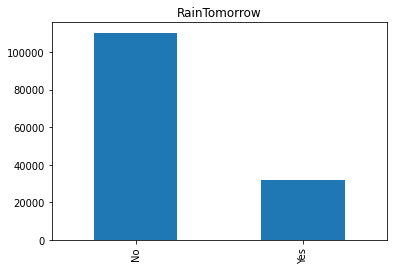

In [ ]:
data['RainTomorrow'].value_counts().plot(kind='bar', title = "RainTomorrow")

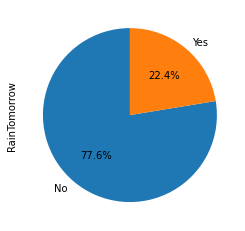

In [ ]:
data['RainTomorrow'].value_counts().plot.pie(autopct='%1.1f%%', startangle = 90)

Dựa vào số lượng  giá trị "Yes" và "No" của biến mục tiêu  => Bộ dữ liệu mất cân bằng

In [ ]:
data.head()

,Date,Location,MinTemp,MaxTemp,Rainfall,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
0,2008-12-01,Albury,13.4,22.9,0.6,W,44.0,W,WNW,20.0,24.0,71.0,22.0,1007.7,1007.1,16.9,21.8,No,No
1,2008-12-02,Albury,7.4,25.1,0.0,WNW,44.0,NNW,WSW,4.0,22.0,44.0,25.0,1010.6,1007.8,17.2,24.3,No,No
2,2008-12-03,Albury,12.9,25.7,0.0,WSW,46.0,W,WSW,19.0,26.0,38.0,30.0,1007.6,1008.7,21.0,23.2,No,No
3,2008-12-04,Albury,9.2,28.0,0.0,NE,24.0,SE,E,11.0,9.0,45.0,16.0,1017.6,1012.8,18.1,26.5,No,No
4,2008-12-05,Albury,17.5,32.3,1.0,W,41.0,ENE,NW,7.0,20.0,82.0,33.0,1010.8,1006.0,17.8,29.7,No,No


## Biến phân loại

In [ ]:
cat_cols=data.select_dtypes(object).columns.tolist()
print('Có', len(cat_cols), ' biến phân loại , gồm có:', "\n", cat_cols, '\n')
for i in cat_cols:
    unique_no = data[i].nunique()
    unique_name = data[i].unique().tolist()
    print(i, 'có ', unique_no, 'có giá trị :')
    print(unique_name, "\n")

Có 7  biến phân loại , gồm có: 
 ['Date', 'Location', 'WindGustDir', 'WindDir9am', 'WindDir3pm', 'RainToday', 'RainTomorrow'] 

Date có  3436 có giá trị :
['2008-12-01', '2008-12-02', '2008-12-03', '2008-12-04', '2008-12-05', '2008-12-06', '2008-12-07', '2008-12-08', '2008-12-09', '2008-12-10', '2008-12-11', '2008-12-12', '2008-12-13', '2008-12-14', '2008-12-16', '2008-12-17', '2008-12-18', '2008-12-19', '2008-12-20', '2008-12-21', '2008-12-22', '2008-12-23', '2008-12-24', '2008-12-25', '2008-12-26', '2008-12-27', '2008-12-28', '2008-12-29', '2008-12-30', '2008-12-31', '2009-01-01', '2009-01-02', '2009-01-03', '2009-01-04', '2009-01-05', '2009-01-06', '2009-01-07', '2009-01-08', '2009-01-09', '2009-01-10', '2009-01-11', '2009-01-12', '2009-01-13', '2009-01-14', '2009-01-15', '2009-01-16', '2009-01-17', '2009-01-18', '2009-01-19', '2009-01-20', '2009-01-21', '2009-01-22', '2009-01-23', '2009-01-24', '2009-01-25', '2009-01-26', '2009-01-27', '2009-01-28', '2009-01-29', '2009-01-30', '200

Có 6 biến phân loại ( Vì biến RainTomorrow là biến mục tiêu )

In [ ]:
# Đối với biến date chia thành ngày, tháng, năm
data['Date'] = pd.to_datetime(data['Date'])
data['Year'] = data['Date'].dt.year
data['Month'] = data['Date'].dt.month
data['Day'] = data['Date'].dt.day

In [ ]:
data.head()

,Date,Location,MinTemp,MaxTemp,Rainfall,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,WindSpeed9am,...,Humidity3pm,Pressure9am,Pressure3pm,Temp9am,Temp3pm,RainToday,RainTomorrow,Year,Month,Day
0,2008-12-01,Albury,13.4,22.9,0.6,W,44.0,W,WNW,20.0,...,22.0,1007.7,1007.1,16.9,21.8,No,No,2008,12,1
1,2008-12-02,Albury,7.4,25.1,0.0,WNW,44.0,NNW,WSW,4.0,...,25.0,1010.6,1007.8,17.2,24.3,No,No,2008,12,2
2,2008-12-03,Albury,12.9,25.7,0.0,WSW,46.0,W,WSW,19.0,...,30.0,1007.6,1008.7,21.0,23.2,No,No,2008,12,3
3,2008-12-04,Albury,9.2,28.0,0.0,NE,24.0,SE,E,11.0,...,16.0,1017.6,1012.8,18.1,26.5,No,No,2008,12,4
4,2008-12-05,Albury,17.5,32.3,1.0,W,41.0,ENE,NW,7.0,...,33.0,1010.8,1006.0,17.8,29.7,No,No,2008,12,5


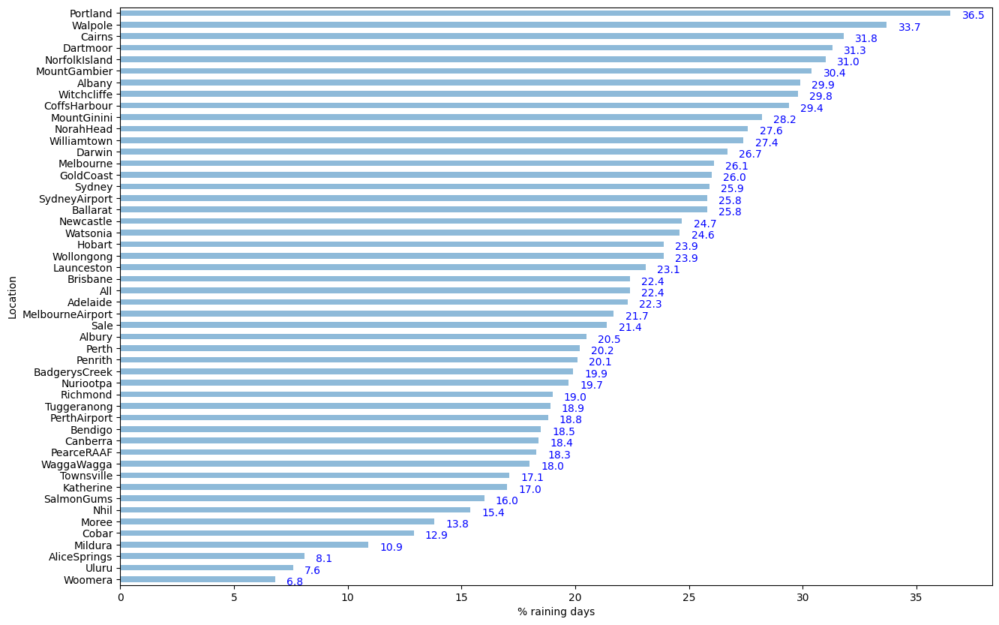

In [ ]:
data_location = pd.crosstab(index=data['Location'], columns=data['RainTomorrow'], values=data['RainTomorrow'], aggfunc='count', margins=True)
data_location['% Yes'] = (data_location['Yes']/data_location['All']).round(3)*100
f, ax = plt.subplots(figsize=(15,10))
data_location['% Yes'].sort_values().plot(kind='barh', alpha=0.5)
ax.set_xlabel ('% raining days')
y = data_location['% Yes'].sort_values().values
for h, v in enumerate(y):
    ax.text(v+0.5 , h-0.5 , round(float(v),1), color='blue')

Nhận xét: về biến Location 
* Portland, Walpole, Cairns : là 3 nơi xảy ra mưa cao nhất 
* Woomera, Uluru, AliceSprings : là 3 nơi  mưa ít nhất 

Text(0, 0.5, '% Raining days')

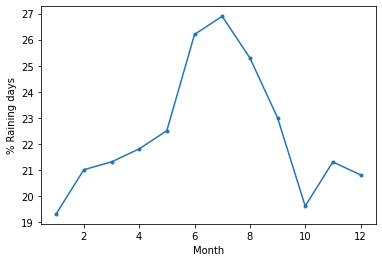

In [ ]:
data['Year'] = pd.DatetimeIndex(data['Date']).year
data['Month'] = pd.DatetimeIndex(data['Date']).month

rain_month = pd.crosstab(index=data['Month'], columns=data['RainTomorrow'], margins=True)
rain_month['%Yes'] = (rain_month['Yes'] / rain_month['All']).round(3)*100 
rain_month.iloc[:-1,-1].plot(style='.-')
plt.xlabel('Month')
plt.ylabel('% Raining days')

Nhận xét : 
* Tập trung mưa nhiều vào mùa hè từ tháng 6 đến tháng 8

## Biến liên tục

In [ ]:
num_cols = data.select_dtypes(include=np.number).columns.tolist()
print('Có :', len(num_cols), 'biến liên tục,gồm có:')
print(num_cols, "\n")

Có : 15 biến liên tục,gồm có:
['MinTemp', 'MaxTemp', 'Rainfall', 'WindGustSpeed', 'WindSpeed9am', 'WindSpeed3pm', 'Humidity9am', 'Humidity3pm', 'Pressure9am', 'Pressure3pm', 'Temp9am', 'Temp3pm', 'Year', 'Month', 'Day'] 



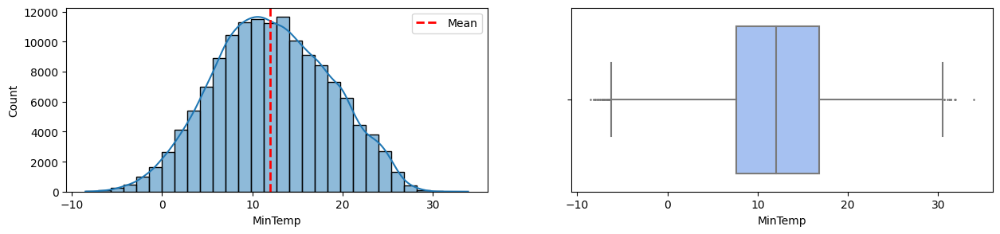

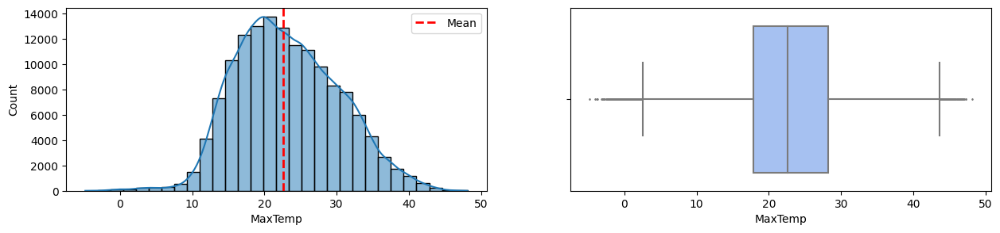

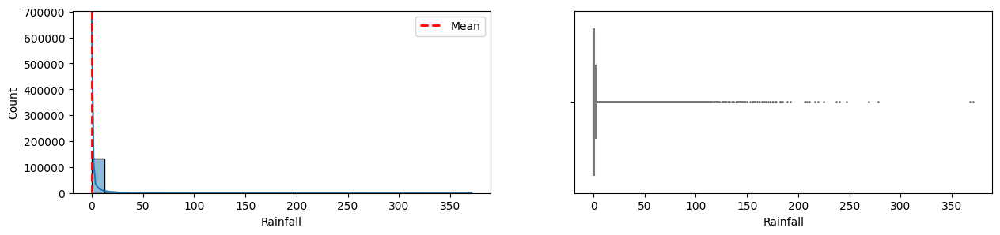

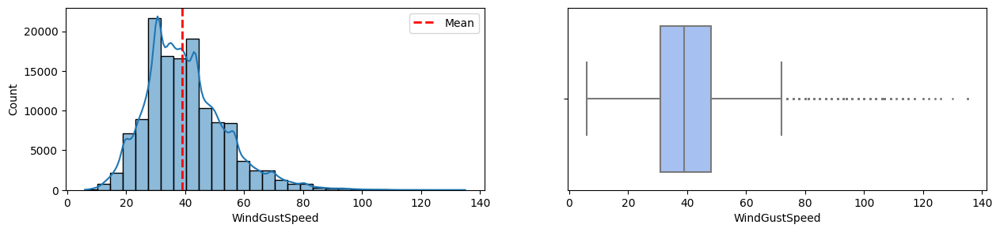

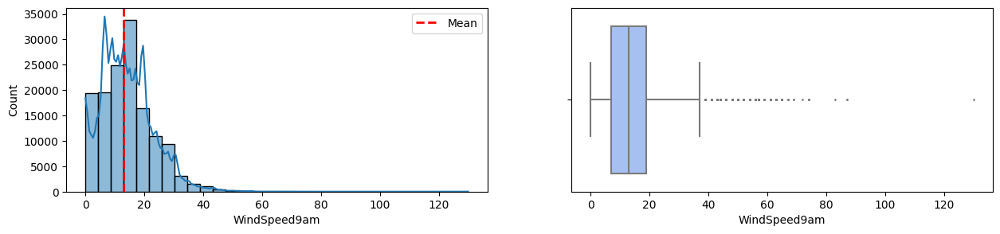

...

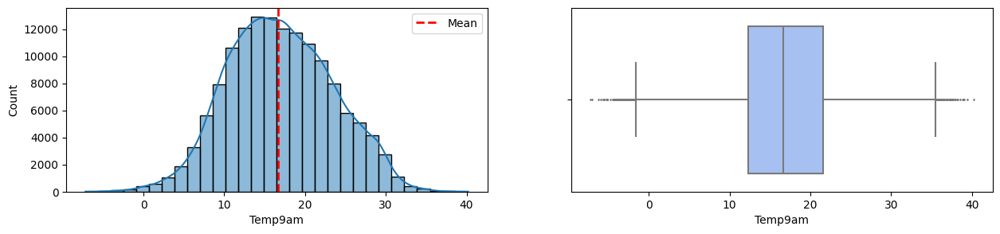

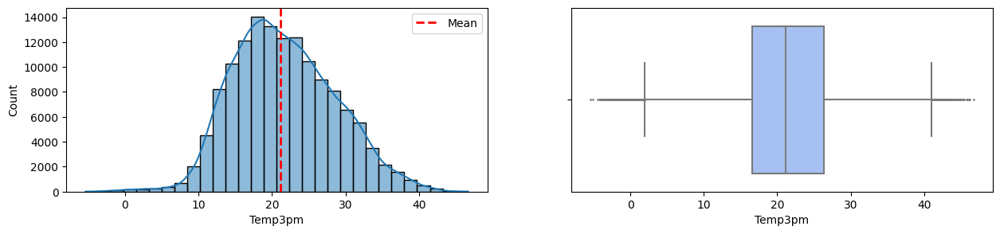

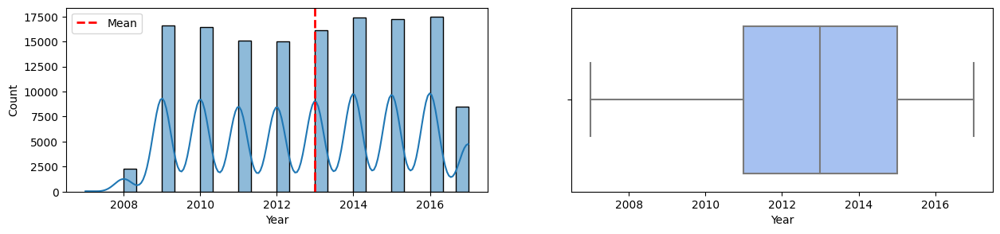

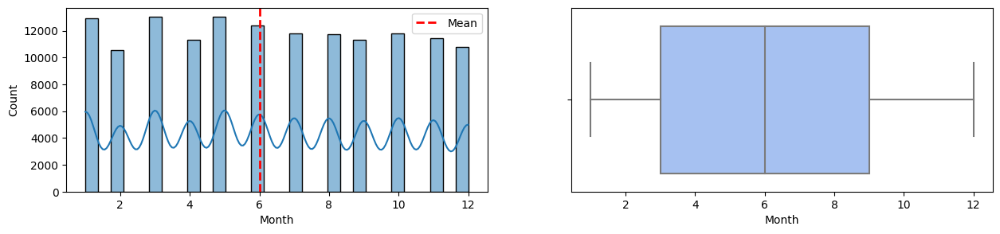

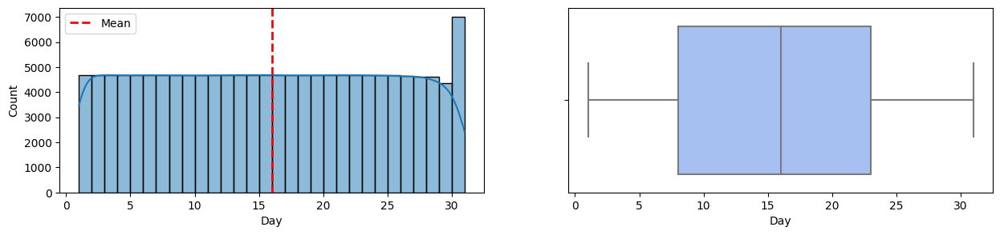

In [ ]:
for i in num_cols:
   
    fig, axs = plt.subplots(1,2,figsize=(15, 3))

    sns.histplot(data[i],bins= 30 , kde=True,ax=axs[0]);
    sns.boxplot(data[i], ax = axs[1], color='#99befd', fliersize=1);
    
    axs[0].axvline(data[i].median(), color='r', linewidth=2, linestyle='--', label='Mean')
    axs[0].legend()

=> Một số biến như : Rainfall , WinGutSpeed,Humidity9am,Preassure9am ,Preassure3am  có nhiều outlier

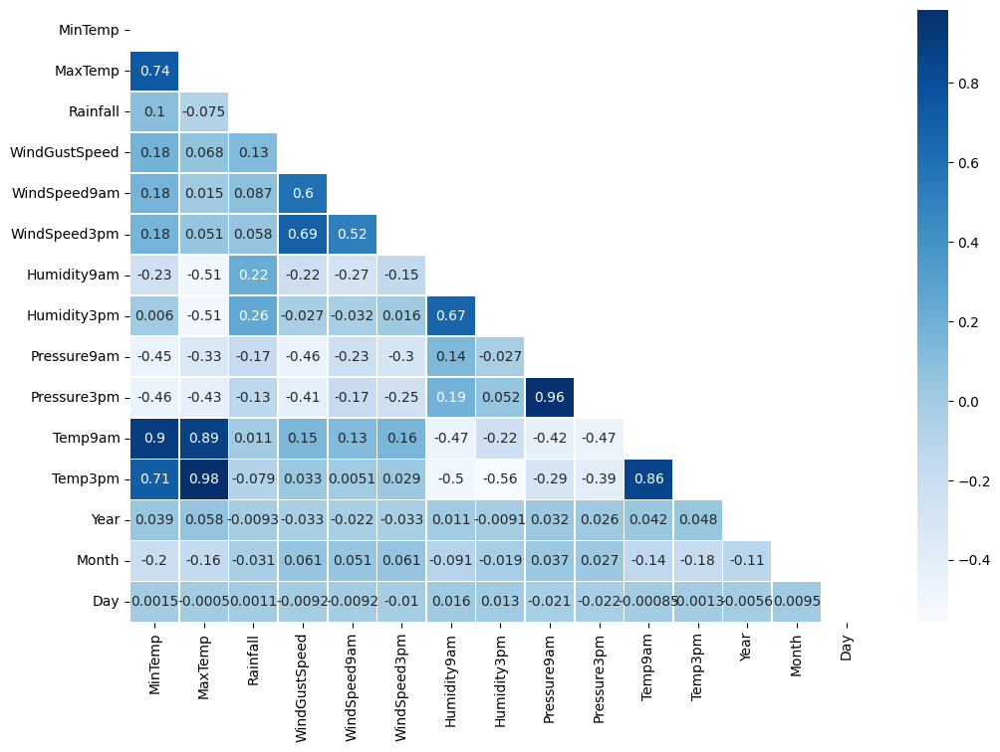

In [ ]:
fig, ax = plt.subplots(figsize=(12,8))
mask = np.triu(np.ones_like(data.corr(), dtype=np.bool))
sns.heatmap(data.corr(), annot=True, cmap="Blues", mask=mask, linewidth=0.5)

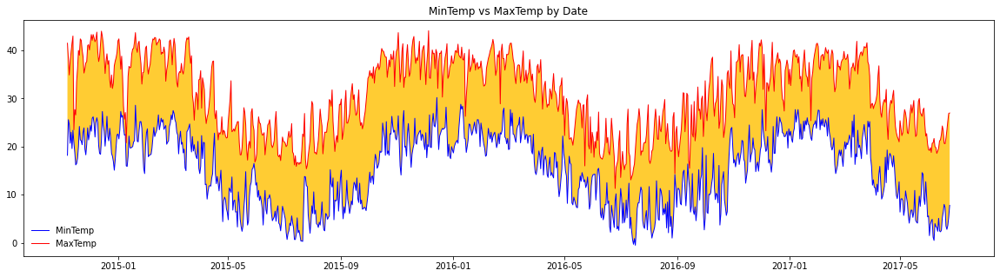

In [ ]:
# Với Nhiệt độ với dữ liệu thời gian
data_date = data.iloc[-950:,:]
plt.figure(figsize=[20,5])
plt.plot(data_date['Date'],data_date['MinTemp'],color='blue',linewidth=1, label= 'MinTemp')
plt.plot(data_date['Date'],data_date['MaxTemp'],color='red',linewidth=1, label= 'MaxTemp')
plt.fill_between(data_date['Date'],data_date['MinTemp'],data_date['MaxTemp'], facecolor = '#FFCC33')
plt.title('MinTemp vs MaxTemp by Date')
plt.legend(loc='lower left', frameon=False)
plt.show()

Text(0, 0.5, '% Raining days')

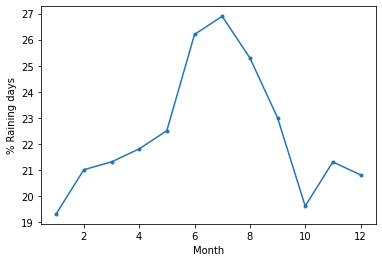

In [ ]:
data['Year'] = pd.DatetimeIndex(data['Date']).year
data['Month'] = pd.DatetimeIndex(data['Date']).month

rain_month = pd.crosstab(index=data['Month'], columns=data['RainTomorrow'], margins=True)
rain_month['%Yes'] = (rain_month['Yes'] / rain_month['All']).round(3)*100 
rain_month.iloc[:-1,-1].plot(style='.-')
plt.xlabel('Month')
plt.ylabel('% Raining days')

Nhận xét :
* MaxTemp và MinTemp tăng giảm tỉ lệ với nhau theo thời gian
* Mưa nhiều tập trung vào mùa hè : từ tháng 6 - 8
* Tháng 12 đến tháng 2 là mùa hè; Tháng 3 đến tháng 5 là mùa thu; Tháng 6 đến tháng 8 là mùa đông; và tháng 9 đến tháng 11 là mùa xuân.

In [ ]:
# Loại bỏ biến Date
data.drop('Date',inplace= True,axis=1)

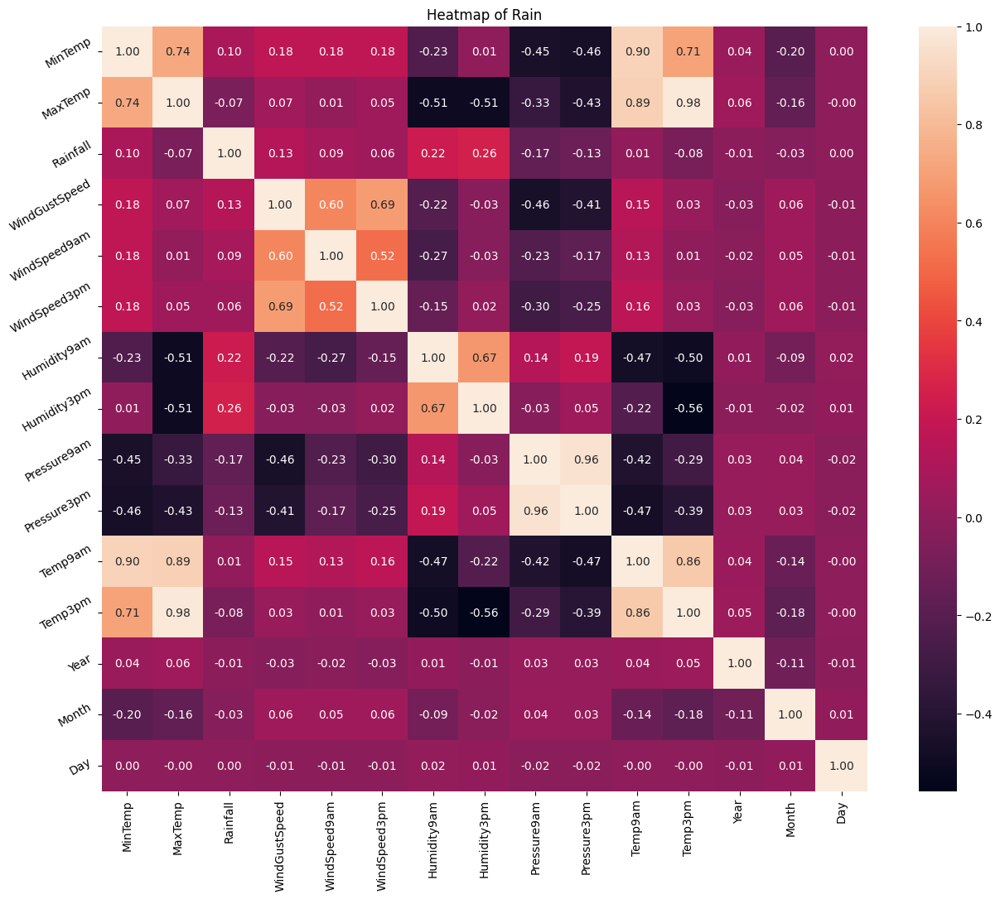

In [ ]:
correlation = data.corr()
plt.figure(figsize=(16,12))
plt.title('Heatmap of Rain')
ax = sns.heatmap(correlation, square=True, annot=True, fmt='.2f', linecolor='white')
ax.set_xticklabels(ax.get_xticklabels(), rotation=90)
ax.set_yticklabels(ax.get_yticklabels(), rotation=30)           
plt.show()

Nhận xét : Một số biến có độ tương quan cao như:
* MinTemp and MaxTemp : 0.74 
* MinTemp and Temp3pm : 0.71
* MinTemp and Temp9am : 0.90
* MaxTemp and Temp3pm : 0.98
*  WindGustSpeed and WindSpeed3pm : 0.69
* Pressure9am and Pressure3pm : 0.96
* Temp9am and Temp3pm : 0.86

# Model

## Tiền xử lí

### Biến  phân loại

 Xử lí missing data => get_dummies

In [ ]:
num_cols=data.select_dtypes(include=np.number).columns.tolist()
cat_cols=data.select_dtypes(object).columns.tolist()
cat_cols = [col for col in cat_cols if col != 'RainTomorrow']
cat_cols

['Location', 'WindGustDir', 'WindDir9am', 'WindDir3pm', 'RainToday']

In [ ]:
# Xử lí missning data
for col in cat_cols:
    col_mode=data[col].mode()[0]
    data[col].fillna(col_mode, inplace=True) 

In [ ]:
data[cat_cols].isnull().sum()

Location       0
WindGustDir    0
WindDir9am     0
WindDir3pm     0
RainToday      0
dtype: int64

In [ ]:
cat_col =['Location', 'WindGustDir', 'WindDir9am', 'WindDir3pm']

In [ ]:
data = pd.get_dummies(data=data, columns= cat_col)
data.head()

,MinTemp,MaxTemp,Rainfall,WindGustSpeed,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,...,WindDir3pm_NNW,WindDir3pm_NW,WindDir3pm_S,WindDir3pm_SE,WindDir3pm_SSE,WindDir3pm_SSW,WindDir3pm_SW,WindDir3pm_W,WindDir3pm_WNW,WindDir3pm_WSW
0,13.4,22.9,0.6,44.0,20.0,24.0,71.0,22.0,1007.7,1007.1,...,0,0,0,0,0,0,0,0,1,0
1,7.4,25.1,0.0,44.0,4.0,22.0,44.0,25.0,1010.6,1007.8,...,0,0,0,0,0,0,0,0,0,1
2,12.9,25.7,0.0,46.0,19.0,26.0,38.0,30.0,1007.6,1008.7,...,0,0,0,0,0,0,0,0,0,1
3,9.2,28.0,0.0,24.0,11.0,9.0,45.0,16.0,1017.6,1012.8,...,0,0,0,0,0,0,0,0,0,0
4,17.5,32.3,1.0,41.0,7.0,20.0,82.0,33.0,1010.8,1006.0,...,0,1,0,0,0,0,0,0,0,0


In [ ]:
# Biến RainToday có 2 giá trị là Yes và No
data['RainToday'].replace({'Yes':1,'No':0},inplace=True)


In [ ]:
# Đối với biến mục tiêu
data['RainTomorrow'].replace({'Yes':1,'No':0},inplace=True)

### Đối với biến liên tục

In [ ]:
num_cols

['MinTemp',
 'MaxTemp',
 'Rainfall',
 'WindGustSpeed',
 'WindSpeed9am',
 'WindSpeed3pm',
 'Humidity9am',
 'Humidity3pm',
 'Pressure9am',
 'Pressure3pm',
 'Temp9am',
 'Temp3pm',
 'Year',
 'Month',
 'Day']

In [ ]:
# xử lí missing data
for col in num_cols:
    col_median=data[col].median()
    data[col].fillna(col_median, inplace=True) 

In [ ]:
data[num_cols].isnull().sum()

MinTemp          0
MaxTemp          0
Rainfall         0
WindGustSpeed    0
WindSpeed9am     0
WindSpeed3pm     0
Humidity9am      0
Humidity3pm      0
Pressure9am      0
Pressure3pm      0
Temp9am          0
Temp3pm          0
Year             0
Month            0
Day              0
dtype: int64

## Phân chia tập Train / Test

In [ ]:
x = data.drop('RainTomorrow', axis=1)
y = data['RainTomorrow']

In [ ]:
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size = 0.2,stratify = y)
print(f"Train Data: {x_train.shape}, {y_train.shape}")
print(f"Train Data: {x_test.shape}, {y_test.shape}")

Train Data: (113754, 113), (113754,)
Train Data: (28439, 113), (28439,)


In [ ]:
std_scaler  = StandardScaler()
x_train = std_scaler.fit_transform(x_train)
x_test = std_scaler.transform(x_test)

## Huấn luyện mô hình

In [ ]:
model1 = {
    'LGBMClassifier': lgbm.LGBMClassifier(objective="binary", n_estimators=200, random_state=42),
    'XGBClassifier': XGBClassifier(max_depth= 5, n_estimators= 100, random_state=42),
    'Random Forest Classifier': RandomForestClassifier(random_state=0),
    'Gradient Boosting Classifier': GradientBoostingClassifier(random_state=0),
    'Decison Tree': DecisionTreeClassifier(random_state=0),
    'Catboost':CatBoostClassifier(iterations=50,random_seed=42,learning_rate=0.5,custom_loss=['AUC', 'Accuracy'])
            }

In [ ]:
model_list = []
train_acc_list = []
test_acc_list = []
counter_list = []

for model, clf in model1.items():
    clf.fit(x_train, y_train)
    predictions = clf.predict(x_test)
    acc = accuracy_score(y_test, predictions)
    train_pred =  clf.predict(x_train)
    train_acc = accuracy_score(y_train, train_pred)
    counter = Counter(predictions)
    print(model, 'Model')
    print(classification_report(y_test, predictions))
    print(confusion_matrix(y_test,predictions))
    print('--------------------------------')
    
    model_list.append(model)
    train_acc_list.append(train_acc)
    test_acc_list.append(acc)   
    counter_list.append(counter)

LGBMClassifier Model
              precision    recall  f1-score   support

           0       0.88      0.95      0.91     22064
           1       0.75      0.54      0.63      6375

    accuracy                           0.86     28439
   macro avg       0.81      0.74      0.77     28439
weighted avg       0.85      0.86      0.85     28439

[[20903  1161]
 [ 2925  3450]]
--------------------------------
XGBClassifier Model
              precision    recall  f1-score   support

           0       0.87      0.95      0.91     22064
           1       0.75      0.50      0.60      6375

    accuracy                           0.85     28439
   macro avg       0.81      0.73      0.76     28439
weighted avg       0.84      0.85      0.84     28439

[[20998  1066]
 [ 3169  3206]]
--------------------------------
Random Forest Classifier Model
              precision    recall  f1-score   support

           0       0.87      0.96      0.91     22064
           1       0.78      0.49    

In [ ]:
results = pd.DataFrame({"model": model_list, "train_accuracy": train_acc_list, "test_acc": test_acc_list, 'counter': counter_list})

In [ ]:
display(results)
Counter(y_test)

,model,train_accuracy,test_acc,counter
0,LGBMClassifier,0.872892,0.856324,"{0: 23828, 1: 4611}"
1,XGBClassifier,0.858924,0.851085,"{0: 24167, 1: 4272}"
2,Random Forest Classifier,0.999991,0.854038,"{0: 24445, 1: 3994}"
3,Gradient Boosting Classifier,0.849948,0.846443,"{0: 24287, 1: 4152}"
4,Decison Tree,1.000000,0.784240,"{0: 21952, 1: 6487}"
5,Catboost,0.862836,0.852913,"{0: 23959, 1: 4480}"


Counter({0: 22064, 1: 6375})

=> Mô hình Random Forest và Decision Tree đang gặp hiện tượng overfitting

=> Lựa chọn mô hình LGBMClassifier,Catboost

---



# Mô hình LightGBM


In [ ]:
lightgbm = lgbm.LGBMClassifier()
params = {
    'num_leaves': [20,50,80,100],
    'learing_rate': [0.01, 0.05,0.1,0.3],
    'n_estimators': [100, 200, 300],
}
gs = GridSearchCV(lightgbm, params,n_jobs = -1, cv = 3, scoring = 'accuracy',error_score = 0)
gs.fit(x_train, y_train)

GridSearchCV(cv=3, error_score=0, estimator=LGBMClassifier(), n_jobs=-1,
             param_grid={'learing_rate': [0.01, 0.05, 0.1, 0.3],
                         'n_estimators': [100, 200, 300],
                         'num_leaves': [20, 50, 80, 100]},
             scoring='accuracy')

In [ ]:
gs.best_params_

{'learing_rate': 0.01, 'n_estimators': 300, 'num_leaves': 80}

In [ ]:
lgbm1 = lgbm.LGBMClassifier(learing_rate =  0.01, n_estimators= 300, num_leaves = 80)
lgbm1.fit(x_train, y_train)
pred=lgbm1.predict(x_test)
print("Accuracy for LightBGM  on CV data: ",accuracy_score(y_test,pred))

Accuracy for LightBGM  on CV data:  0.8611062273638314


              precision    recall  f1-score   support

           0       0.88      0.95      0.91     22064
           1       0.76      0.55      0.64      6375

    accuracy                           0.86     28439
   macro avg       0.82      0.75      0.78     28439
weighted avg       0.85      0.86      0.85     28439

[[20968  1096]
 [ 2854  3521]]


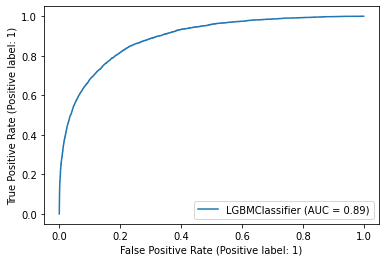

In [ ]:
print(classification_report(y_test, pred))
print(confusion_matrix(y_test,pred))
Counter(y_test)
metrics.plot_roc_curve(lgbm1,x_test, y_test)

# Mô hình Catboost

In [ ]:
catboost_pram = {'iterations': [100, 200],
        'learning_rate': [0.05, 0.07, 0.1],
        'max_depth': [10, 11, 12],
        'l2_leaf_reg': [0.2, 0.5, 0.7, 1]
       }

In [ ]:
cat = CatBoostClassifier()
grid2 = GridSearchCV(estimator = cat , param_grid = catboost_pram,n_jobs = -1 , cv = 3, scoring = "accuracy",error_score = 0)
grid2.fit(x_train,y_train)
grid2.best_params_

0:	learn: 0.6200246	total: 98ms	remaining: 19.5s
1:	learn: 0.5641453	total: 194ms	remaining: 19.2s
2:	learn: 0.5229111	total: 280ms	remaining: 18.4s
3:	learn: 0.4896360	total: 368ms	remaining: 18s
4:	learn: 0.4643181	total: 450ms	remaining: 17.5s
5:	learn: 0.4455980	total: 536ms	remaining: 17.3s
6:	learn: 0.4300587	total: 628ms	remaining: 17.3s
7:	learn: 0.4174276	total: 712ms	remaining: 17.1s
8:	learn: 0.4074086	total: 797ms	remaining: 16.9s
9:	learn: 0.3999724	total: 889ms	remaining: 16.9s
10:	learn: 0.3927394	total: 972ms	remaining: 16.7s
11:	learn: 0.3871354	total: 1.05s	remaining: 16.5s
12:	learn: 0.3819764	total: 1.14s	remaining: 16.5s
13:	learn: 0.3782492	total: 1.23s	remaining: 16.3s
14:	learn: 0.3751499	total: 1.31s	remaining: 16.2s
15:	learn: 0.3724391	total: 1.4s	remaining: 16.1s
16:	learn: 0.3700422	total: 1.49s	remaining: 16s
17:	learn: 0.3673530	total: 1.57s	remaining: 15.9s
18:	learn: 0.3653469	total: 1.67s	remaining: 15.9s
19:	learn: 0.3638269	total: 1.75s	remaining: 15

{'iterations': 200, 'l2_leaf_reg': 1, 'learning_rate': 0.1, 'max_depth': 10}

In [ ]:
cat_boost = CatBoostClassifier(iterations = 200, l2_leaf_reg = 1, learning_rate = 0.1,max_depth = 10)
cat_boost.fit(x_train, y_train)
pred2=cat_boost.predict(x_test)
print("Accuracy for Catboost  on CV data: ",accuracy_score(y_test,pred2))

0:	learn: 0.6200246	total: 151ms	remaining: 30.1s
1:	learn: 0.5641453	total: 323ms	remaining: 32s
2:	learn: 0.5229111	total: 494ms	remaining: 32.4s
3:	learn: 0.4896360	total: 683ms	remaining: 33.5s
4:	learn: 0.4643181	total: 872ms	remaining: 34s
5:	learn: 0.4455980	total: 1.06s	remaining: 34.2s
6:	learn: 0.4300587	total: 1.2s	remaining: 33.1s
7:	learn: 0.4174276	total: 1.33s	remaining: 32s
8:	learn: 0.4074086	total: 1.45s	remaining: 30.8s
9:	learn: 0.3999724	total: 1.54s	remaining: 29.2s
10:	learn: 0.3927394	total: 1.62s	remaining: 27.8s
11:	learn: 0.3871354	total: 1.7s	remaining: 26.7s
12:	learn: 0.3819764	total: 1.79s	remaining: 25.7s
13:	learn: 0.3782492	total: 1.87s	remaining: 24.9s
14:	learn: 0.3751499	total: 1.97s	remaining: 24.3s
15:	learn: 0.3724391	total: 2.07s	remaining: 23.8s
16:	learn: 0.3700422	total: 2.15s	remaining: 23.2s
17:	learn: 0.3673530	total: 2.24s	remaining: 22.6s
18:	learn: 0.3653469	total: 2.32s	remaining: 22.1s
19:	learn: 0.3638269	total: 2.41s	remaining: 21.7

              precision    recall  f1-score   support

           0       0.88      0.95      0.91     22064
           1       0.76      0.54      0.63      6375

    accuracy                           0.86     28439
   macro avg       0.82      0.75      0.77     28439
weighted avg       0.85      0.86      0.85     28439

[[20969  1095]
 [ 2921  3454]]


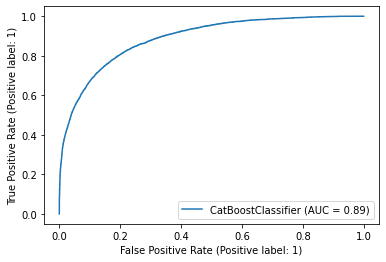

In [ ]:
print(classification_report(y_test, pred2))
print(confusion_matrix(y_test,pred2))
Counter(y_test)
metrics.plot_roc_curve(cat_boost,x_test, y_test)